In [1]:
import sys
sys.path.insert(0, "../nilearn")
import nilearn
from nilearn import datasets, image
from nilearn.input_data import NiftiMasker
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from importlib import reload
%load_ext autoreload

In [2]:
## Load dataset ##
dataset = datasets.fetch_adhd(n_subjects=1)

../nilearn/nilearn/datasets/func.py:439: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  dtype=None)



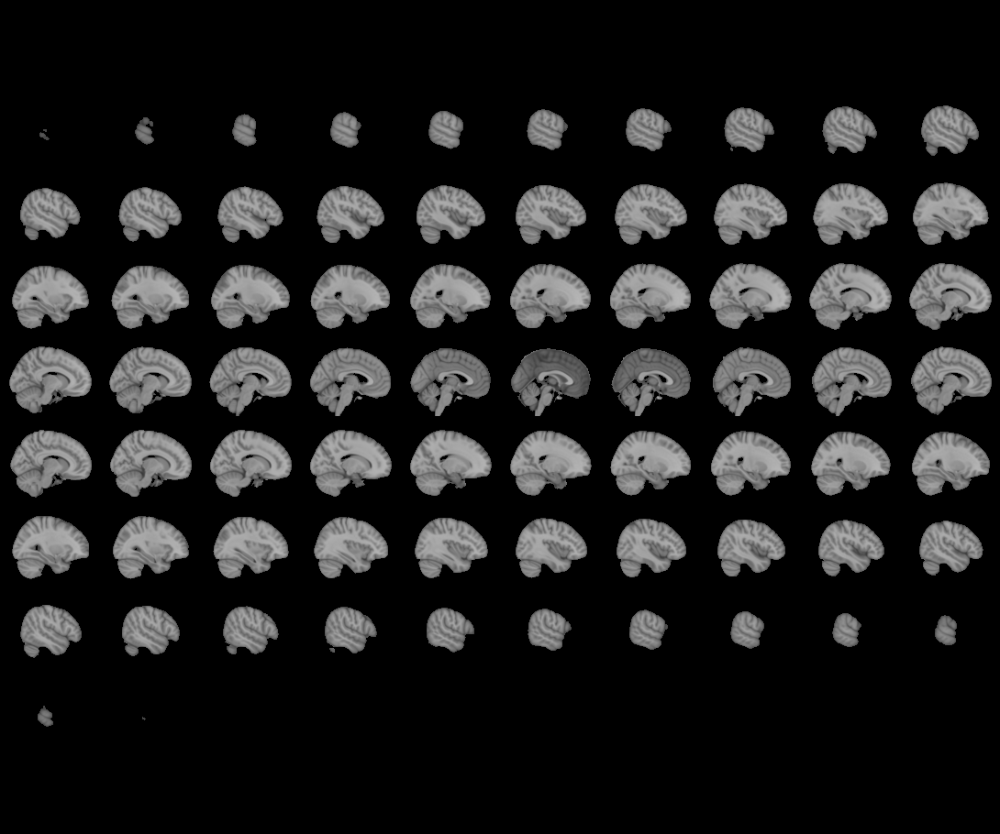
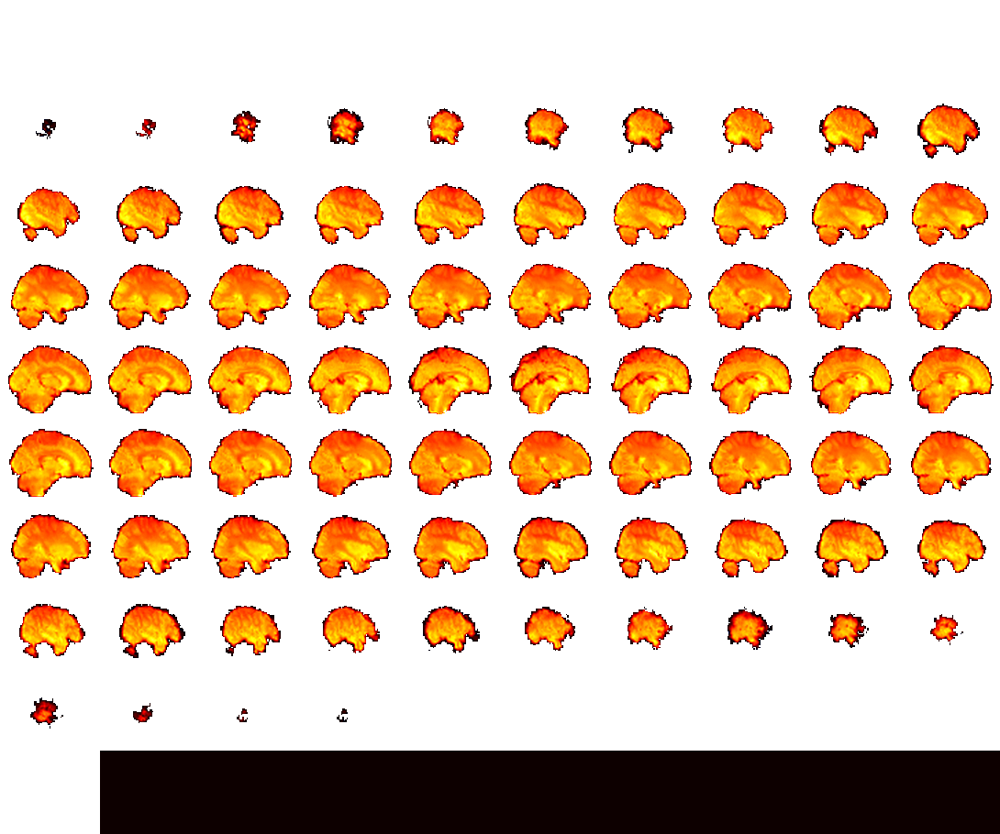

In [3]:
## Get functionnal img ##
img_path = dataset.func[0]
img = nib.load(img_path)
nilearn.plotting.view_img(image.mean_img(img))

In [4]:
## Create masker ##
masker = NiftiMasker(mask_strategy='epi', detrend=True,
                     standardize=True, t_r=2.5)
masker.fit(img_path)

NiftiMasker(detrend=True, dtype=None, high_pass=None, low_pass=None,
            mask_args=None, mask_img=None, mask_strategy='epi',
            memory=Memory(location=None), memory_level=1, reports=True,
            sample_mask=None, sessions=None, smoothing_fwhm=None,
            standardize=True, t_r=2.5, target_affine=None, target_shape=None,
            verbose=0)

In [5]:
#plotting.plot_roi(masker.mask_img_, image.mean_img(img),
#         title="Mask from already masked data")

In [6]:
#masker.generate_report()

In [5]:
# Make time series array
tseries = masker.fit_transform(img)
masked_img = masker.inverse_transform(tseries)
print("time steps:", tseries.shape[0], "; voxels:", tseries.shape[1])

time steps: 176 ; voxels: 62546


In [6]:
img = nilearn.image.clean_img(img, standardize=True)

In [33]:
gm = nilearn.masking.compute_gray_matter_mask(img)

/Users/francois/Documents/BrainHackSchool/bhs_env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function compute_gray_matter_mask is deprecated; Function 'compute_gray_matter_mask' has been renamed to 'compute_brain_mask' and 'compute_gray_matter_mask' will be removed in release 0.9.
  warnings.warn(msg, category=FutureWarning)


In [38]:
np.unique(gm.get_data())

/Users/francois/Documents/BrainHackSchool/bhs_env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  """Entry point for launching an IPython kernel.


array([0, 1], dtype=int8)

In [7]:
atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')

In [8]:
atlas_img = nib.load(atlas.maps)
atlas_img = nilearn.image.resample_img(atlas_img, img.affine)

In [61]:
%autoreload

In [63]:
del view
view = nilearn.plotting.view_volume(img, atlas=atlas_img, marker_size=5, t_r=2.,
                                    opacity=1, stride=2, title="cool viz",
                                    cmap="cold_hot", n_t=100, vmax=3)
view

../nilearn/nilearn/image/resampling.py:512: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
../nilearn/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



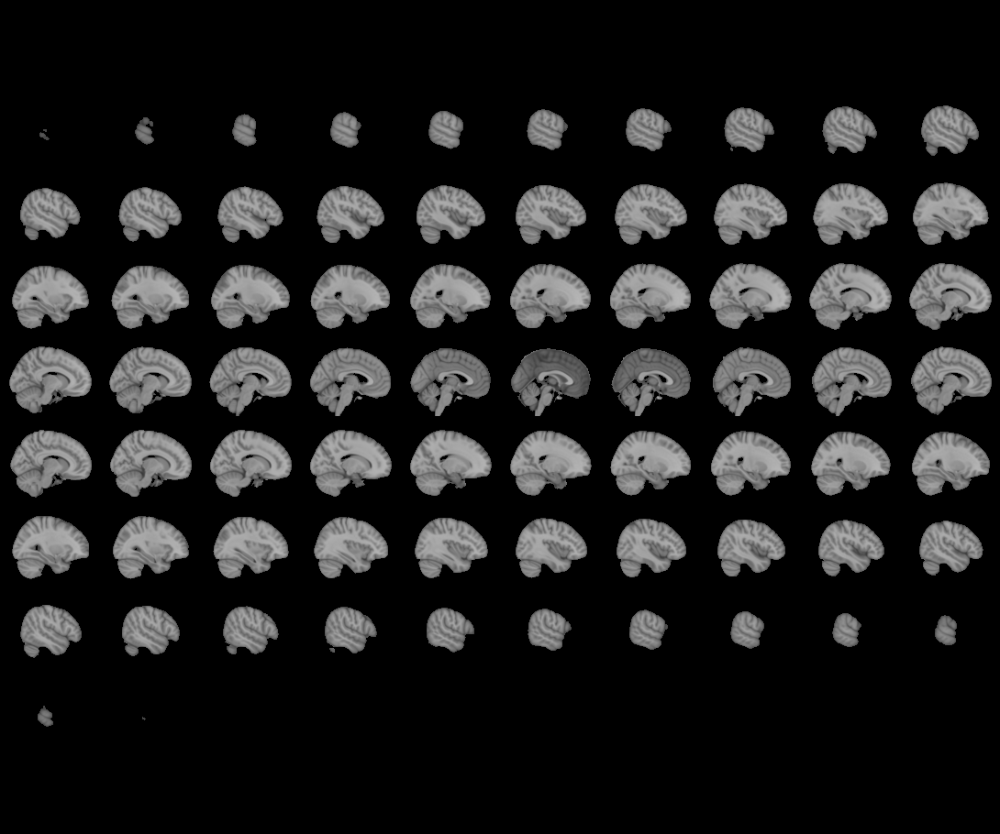
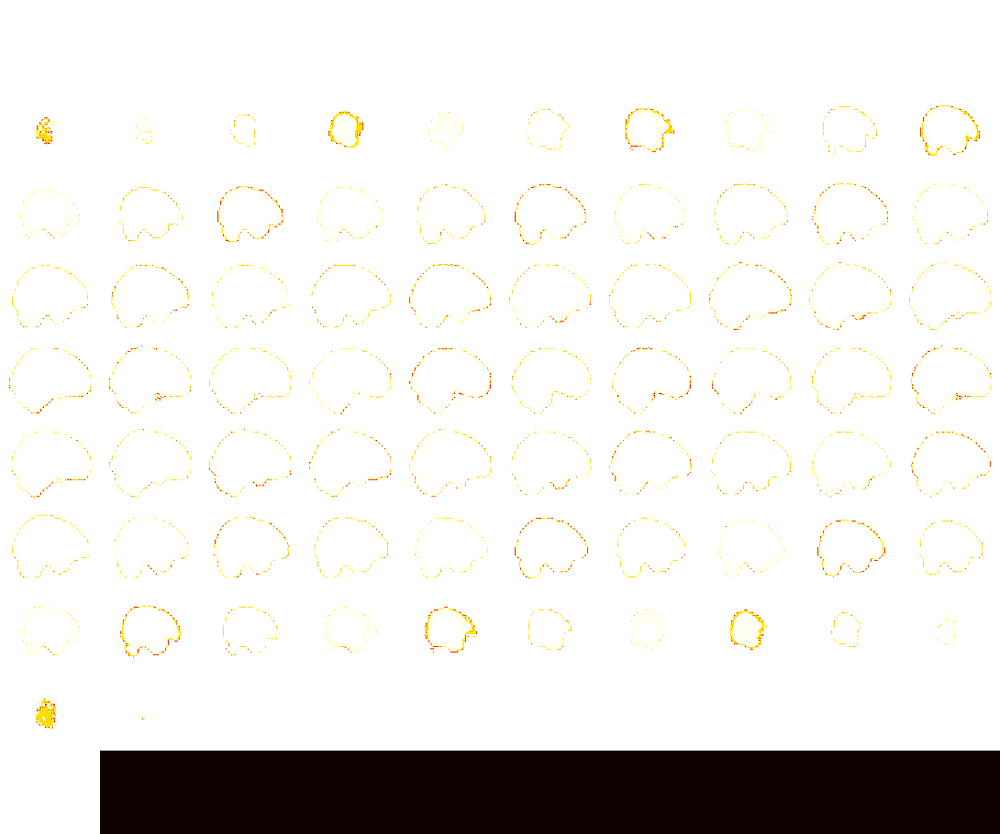

In [90]:
nilearn.plotting.view_img(gm)

In [47]:
bool(1)

True

In [61]:
c_mat = np.random.random((100,100))
coords = np.array([[10*12%(1+k)+3*k%10,5*(k%15)-20,6*k%50] for k in range(100)])
c_view = nilearn.plotting.view_connectome(c_mat, coords, title="test")
c_view

In [62]:
m_view = nilearn.plotting.view_markers([[12,15,16],[5,35,21]], ['red', 'blue'])
m_view

../nilearn/nilearn/image/resampling.py:512: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



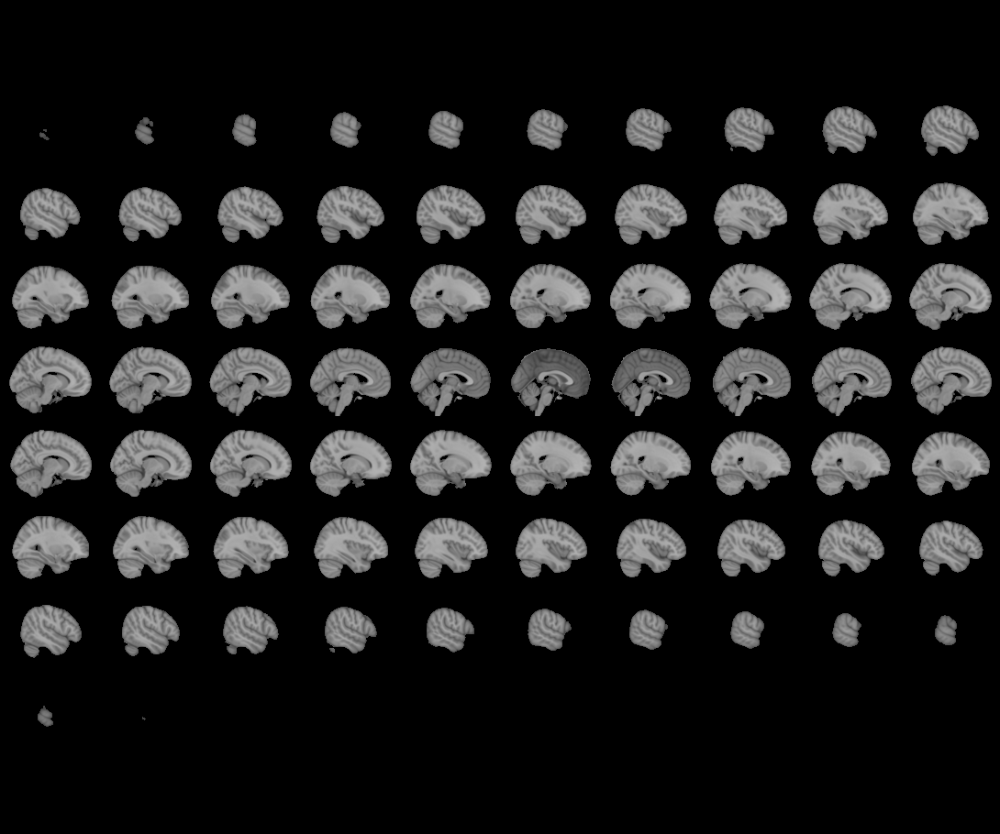
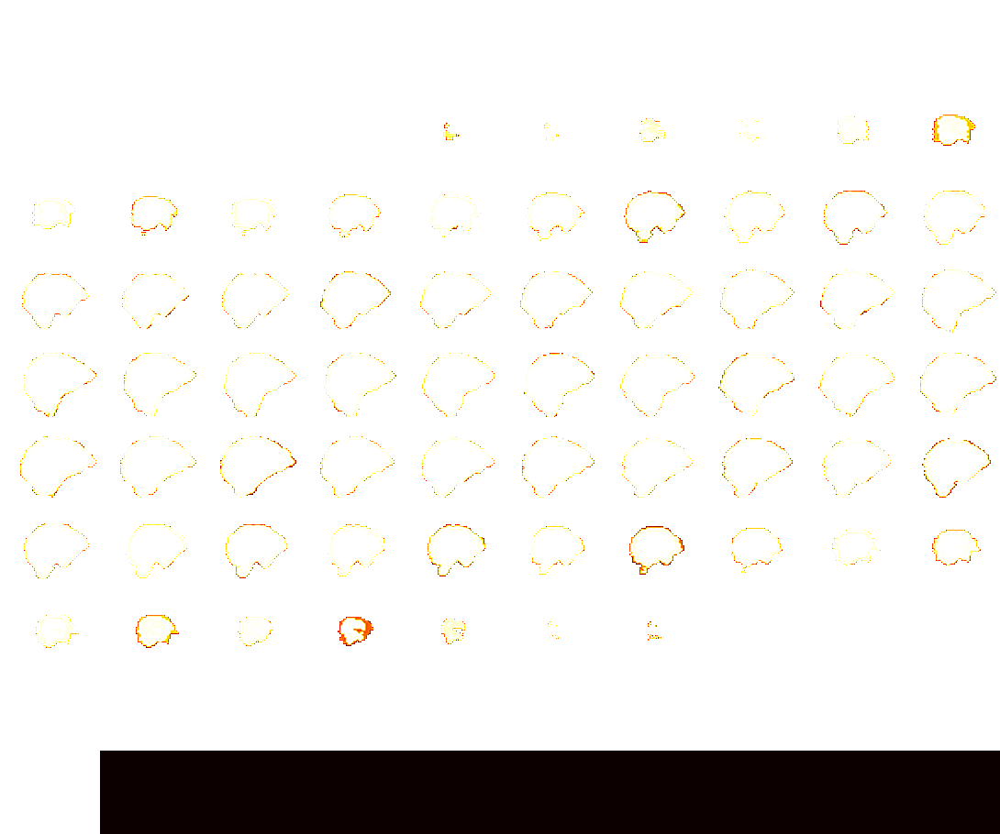

In [13]:
nilearn.plotting.view_img(masker.mask_img_)

In [10]:
nilearn.plotting.view_markers([(1,1,1), (2,2,2)], ['blue', 'green'])

/Users/francois/Documents/BrainHackSchool/bhs_env/lib/python3.6/site-packages/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



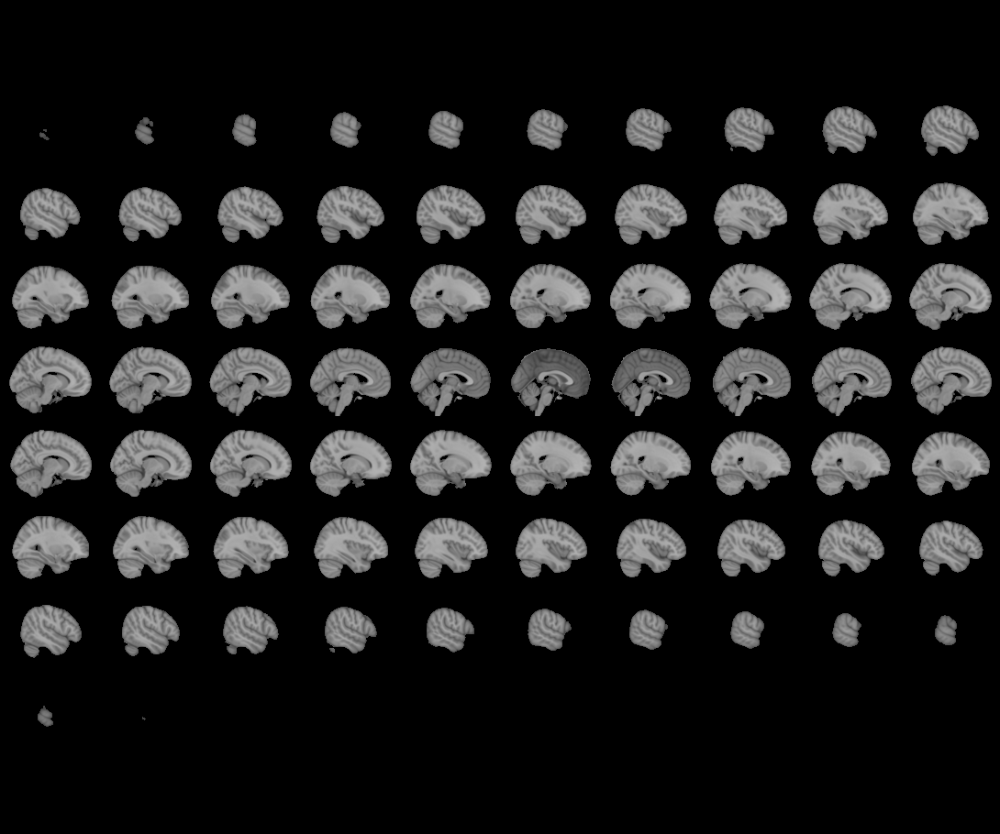
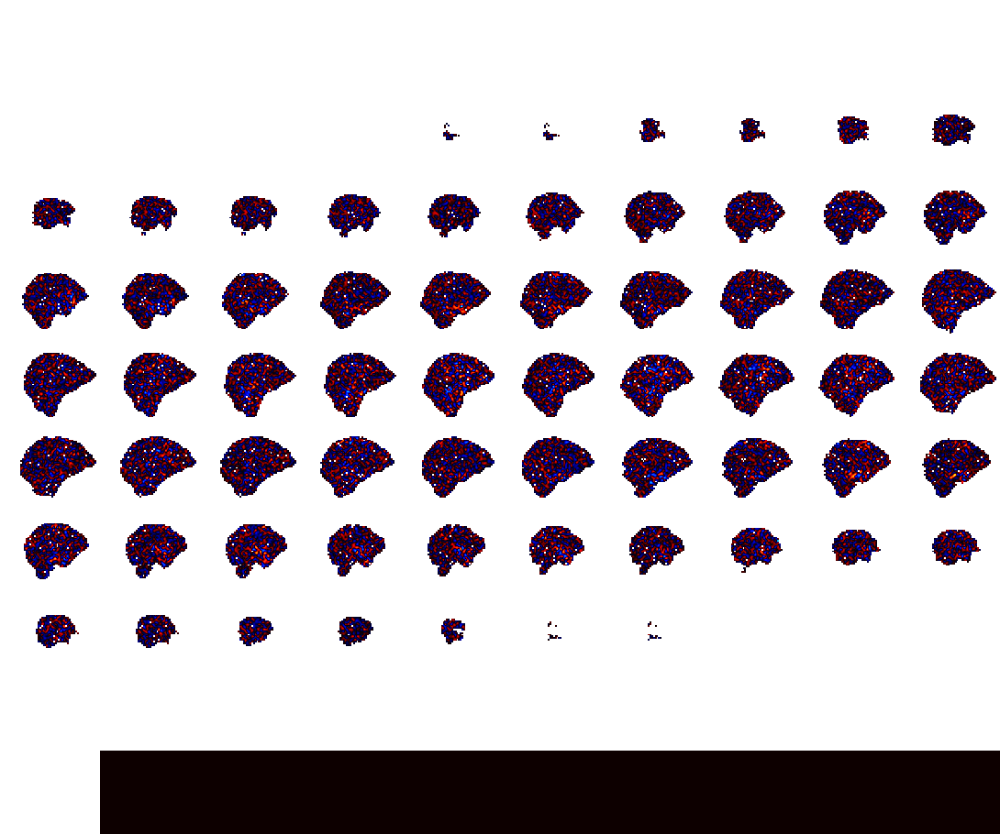

In [88]:
plotting.view_img(image.mean_img(masked_img))

In [ ]:
import matplotlib._color_data as mcd
from nilearn.image.resampling import coord_transform
# cn = mcd.CSS4_COLORS[n]
coords=[]
colors=[]
step = 1
im_data = masked_img.get_data()
max_val = np.max(im_data[:,:,:,:])
min_val = np.min(im_data[:,:,:,:])
for t in range(0,10):
    colors.append([])
    for k in range(0,im_data.shape[2],step):
        for j in range(0,im_data.shape[1],step):
            for i in range(0,im_data.shape[0],step):
                if im_data[i,j,k,0]!=0:
                    if not t:
                        coords.append(coord_transform(i,j,k,masked_img.affine))
                    #colors.append('C'+str(int(max(0,masked_img.get_data()[i,j,k,0]/10))))
                    v = (im_data[i,j,k,t]-min_val)/(max_val-min_val)
                    r = v
                    g = 0
                    b = 1-v
                    colors[t].append((r,g,b))